# Прекод

# Сборный проект-4

Вам поручено разработать демонстрационную версию поиска изображений по запросу.

Для демонстрационной версии нужно обучить модель, которая получит векторное представление изображения, векторное представление текста, а на выходе выдаст число от 0 до 1 — покажет, насколько текст и картинка подходят друг другу.

### Описание данных

Данные лежат в папке `/datasets/image_search/` или доступны по [ссылке](https://code.s3.yandex.net/datasets/dsplus_integrated_project_4.zip).

В файле `train_dataset.csv` находится информация, необходимая для обучения: имя файла изображения, идентификатор описания и текст описания. Для одной картинки может быть доступно до 5 описаний. Идентификатор описания имеет формат `<имя файла изображения>#<порядковый номер описания>`.

В папке `train_images` содержатся изображения для тренировки модели.

В файле `CrowdAnnotations.tsv` — данные по соответствию изображения и описания, полученные с помощью краудсорсинга. Номера колонок и соответствующий тип данных:

1. Имя файла изображения.
2. Идентификатор описания.
3. Доля людей, подтвердивших, что описание соответствует изображению.
4. Количество человек, подтвердивших, что описание соответствует изображению.
5. Количество человек, подтвердивших, что описание не соответствует изображению.

В файле `ExpertAnnotations.tsv` содержатся данные по соответствию изображения и описания, полученные в результате опроса экспертов. Номера колонок и соответствующий тип данных:

1. Имя файла изображения.
2. Идентификатор описания.

3, 4, 5 — оценки трёх экспертов.

Эксперты ставят оценки по шкале от 1 до 4, где 1 — изображение и запрос совершенно не соответствуют друг другу, 2 — запрос содержит элементы описания изображения, но в целом запрос тексту не соответствует, 3 — запрос и текст соответствуют с точностью до некоторых деталей, 4 — запрос и текст соответствуют полностью.

В файле `test_queries.csv` находится информация, необходимая для тестирования: идентификатор запроса, текст запроса и релевантное изображение. Для одной картинки может быть доступно до 5 описаний. Идентификатор описания имеет формат `<имя файла изображения>#<порядковый номер описания>`.

В папке `test_images` содержатся изображения для тестирования модели.

In [1]:
!pip install 'transformers[torch]' optuna

In [2]:
!rm -r to_upload
!wget -qN https://code.s3.yandex.net/datasets/dsplus_integrated_project_4.zip
!unzip -qo dsplus_integrated_project_4.zip

dsplus_integrated_project_4.zip  img_to_text_done.csv  __MACOSX  sample_data  to_upload


In [ ]:
import os
import random

import cv2
import torch
import optuna
import torchvision
import numpy as np
import pandas as pd
import seaborn as sns

from PIL import Image
from pathlib import Path
import matplotlib.pyplot as plt
from IPython.display import display

import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset

import torchvision.models as models
from torch.autograd import Variable
import torchvision.transforms as transforms
from sklearn.linear_model import ElasticNet
from sklearn.metrics import mean_absolute_error
from transformers import AutoTokenizer, AutoModel
from sklearn.model_selection import GroupShuffleSplit
from transformers import BlipProcessor, BlipForConditionalGeneration

In [4]:
PATH = '/content/to_upload'
TRAIN_IMG_PATH = '/content/to_upload/train_images'
TEST_IMG_PATH = '/content/to_upload/test_images'
SEED = 42
BLOCK = ['child', 'boy', 'girl', 'baby',
         'teen', 'teenager', 'kid', 'infant',
         'youngster', 'kids', 'children', 'infant',
         'toddler', 'adolescent', 'youth']

def set_seed(seed:int = SEED) -> None:
    np.random.seed(seed)
    random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
    os.environ["PYTHONHASHSEED"] = str(seed)

set_seed(SEED)

DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

## 1. Исследовательский анализ данных

Наш датасет содержит экспертные и краудсорсинговые оценки соответствия текста и изображения.

В файле с экспертными мнениями для каждой пары изображение-текст имеются оценки от трёх специалистов. Для решения задачи вы должны эти оценки агрегировать — превратить в одну. Существует несколько способов агрегации оценок, самый простой — голосование большинства: за какую оценку проголосовала большая часть экспертов (в нашем случае 2 или 3), та оценка и ставится как итоговая. Поскольку число экспертов меньше числа классов, может случиться, что каждый эксперт поставит разные оценки, например: 1, 4, 2. В таком случае данную пару изображение-текст можно исключить из датасета.

Вы можете воспользоваться другим методом агрегации оценок или придумать свой.

В файле с краудсорсинговыми оценками информация расположена в таком порядке:

1. Доля исполнителей, подтвердивших, что текст **соответствует** картинке.
2. Количество исполнителей, подтвердивших, что текст **соответствует** картинке.
3. Количество исполнителей, подтвердивших, что текст **не соответствует** картинке.

После анализа экспертных и краудсорсинговых оценок выберите либо одну из них, либо объедините их в одну по какому-то критерию: например, оценка эксперта принимается с коэффициентом 0.6, а крауда — с коэффициентом 0.4.

Ваша модель должна возвращать на выходе вероятность соответствия изображения тексту, поэтому целевая переменная должна иметь значения от 0 до 1.


In [5]:
def read_df(path = PATH) -> pd.DataFrame:
    df_train = pd.read_csv(Path(path, 'train_dataset.csv'))

    df_crowd = pd.read_csv(Path(path, 'CrowdAnnotations.tsv'), sep = '\t',
                          names = ['image', 'query_id', 'share_pos', 'count_pos', 'count_neg'])
    df_expert = pd.read_csv(Path(path, 'ExpertAnnotations.tsv'), sep = '\t',
                            names = ['image', 'query_id', 'first', 'second', 'third'])

    df_queries = pd.read_csv(Path(path, 'test_queries.csv'), index_col = [0], sep = '|')
    df_images = pd.read_csv(Path(path, 'test_images.csv'), sep = '|')

    return df_train, df_crowd, df_expert, df_queries, df_images

df_train, df_crowd, df_expert, df_queries, df_images = read_df()

In [6]:
print(f'df_train, length = {len(df_train)}')
display(df_train.head(1))
print()
print(f'df_crowd, length = {len(df_crowd)}')
display(df_crowd.head(1))
print()
print(f'df_expert, length = {len(df_expert)}')
display(df_expert.head(1))
print()
print(f'df_queries, length = {len(df_queries)}')
display(df_queries.head(1))
print()
print(f'df_images, length = {len(df_images)}')
display(df_images.head(1))

df_train, length = 5822


,image,query_id,query_text
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...



df_crowd, length = 47830


,image,query_id,share_pos,count_pos,count_neg
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,1.0,3,0



df_expert, length = 5822


,image,query_id,first,second,third
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1



df_queries, length = 500


,query_id,query_text,image
0,1177994172_10d143cb8d.jpg#0,"Two blonde boys , one in a camouflage shirt an...",1177994172_10d143cb8d.jpg



df_images, length = 100


,image
0,3356748019_2251399314.jpg


Имеем большое количество таблиц различной длинны.

In [7]:
df_expert['avg_expert'] = (df_expert['first'] + df_expert['second'] + df_expert['third']) / 3
df_expert['avg_expert'] = (df_expert['avg_expert'] - 1) / 3
df_expert.head()

,image,query_id,first,second,third,avg_expert
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1,0.000000
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1,1,2,0.111111
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1,1,2,0.111111
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,1,2,2,0.222222
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1,1,2,0.111111


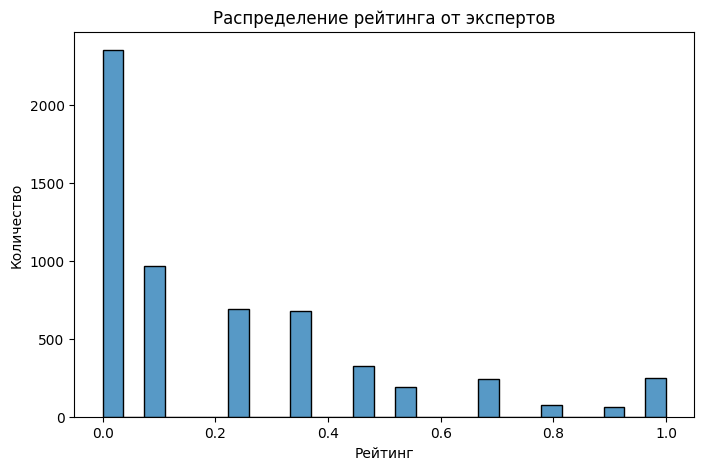

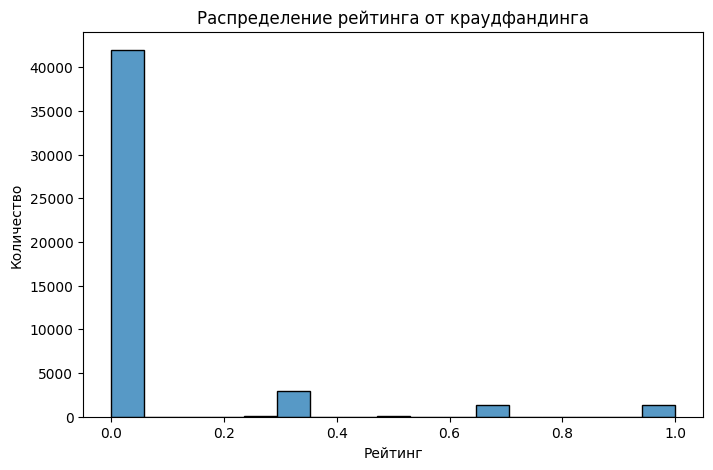

In [8]:
plt.figure(figsize = (8, 5))
sns.histplot(df_expert['avg_expert'])
plt.title('Распределение рейтинга от экспертов')
plt.xlabel('Рейтинг')
plt.ylabel('Количество')
plt.show()

plt.figure(figsize = (8, 5))
sns.histplot(df_crowd['share_pos'])
plt.title('Распределение рейтинга от краудфандинга')
plt.xlabel('Рейтинг')
plt.ylabel('Количество')
plt.show()

Мы наблюдаем значительное количество неверных сочетаний фотографий и описаний, что ожидаемо, поскольку наш датасет включает всего лишь 1500 фотографий и ограниченное количество описаний, в то время как остальные созданы путем комбинирования уже имеющихся заведомо неверных пар фото-описания данных.

In [9]:
df = df_train.merge(df_expert, on = ['image', 'query_id']).sort_values('image')
df = df.reset_index(drop = True)
print(f'df length = {len(df)}')
df.head()

df length = 5822


,image,query_id,query_text,first,second,third,avg_expert
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,1,1,1,0.000000
1,1056338697_4f7d7ce270.jpg,434792818_56375e203f.jpg#2,A man and woman look back at the camera while ...,1,1,2,0.111111
2,1056338697_4f7d7ce270.jpg,3545652636_0746537307.jpg#2,A young boy dressed in a red uniform kicks the...,1,1,1,0.000000
3,1056338697_4f7d7ce270.jpg,3360930596_1e75164ce6.jpg#2,A soccer ball is above the head of a man weari...,1,1,1,0.000000
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,Chinese market street in the winter time .,1,1,2,0.111111


In [10]:
df = df.merge(df_crowd, on = ['image', 'query_id']).sort_values('image')
print(f'df length = {len(df)}')
df.head()

df length = 2329


,image,query_id,query_text,first,second,third,avg_expert,share_pos,count_pos,count_neg
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,1,1,1,0.000000,0.000000,0,3
1,1056338697_4f7d7ce270.jpg,434792818_56375e203f.jpg#2,A man and woman look back at the camera while ...,1,1,2,0.111111,0.000000,0,3
2,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,A girl wearing a yellow shirt and sunglasses s...,1,1,2,0.111111,0.000000,0,3
3,1082379191_ec1e53f996.jpg,1536774449_e16b1b6382.jpg#2,A crowd of people at an outdoor event,1,2,3,0.333333,0.000000,0,3
4,1084040636_97d9633581.jpg,256085101_2c2617c5d0.jpg#2,Close-up of dog in profile with mouth open .,2,3,3,0.555556,0.333333,1,2


In [11]:
print('Count of unqie image =', len(df['image'].unique()))

Count of unqie image = 891


В процессе объединения таблиц было утрачено 609 уникальных изображений.

Сохранение этих изображений оказалось невозможным, так как при их сохранении возникли бы пустые поля в оценках экспертов и пользователей из краудфандинга. Заполнение этих полей вызвало бы проблемы из-за некорректного заполнения.

Рассчитаем сумму двух оценок с использованием коэффициентов, где коэффициент для экспертов (avg_expert) составляет 0.80, а для краудфандинга - 0.20 (share_pos). Этот подход придает приоритет экспертам, поскольку они проверенные специалисты, и вероятность ошибки среди них ниже. Кроме того, эксперты предоставляют более точные оценки.

In [12]:
df['total_rating'] = 0.80 * df['avg_expert'] + 0.20 * df['share_pos']
df.head()

,image,query_id,query_text,first,second,third,avg_expert,share_pos,count_pos,count_neg,total_rating
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,1,1,1,0.000000,0.000000,0,3,0.000000
1,1056338697_4f7d7ce270.jpg,434792818_56375e203f.jpg#2,A man and woman look back at the camera while ...,1,1,2,0.111111,0.000000,0,3,0.088889
2,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,A girl wearing a yellow shirt and sunglasses s...,1,1,2,0.111111,0.000000,0,3,0.088889
3,1082379191_ec1e53f996.jpg,1536774449_e16b1b6382.jpg#2,A crowd of people at an outdoor event,1,2,3,0.333333,0.000000,0,3,0.266667
4,1084040636_97d9633581.jpg,256085101_2c2617c5d0.jpg#2,Close-up of dog in profile with mouth open .,2,3,3,0.555556,0.333333,1,2,0.511111


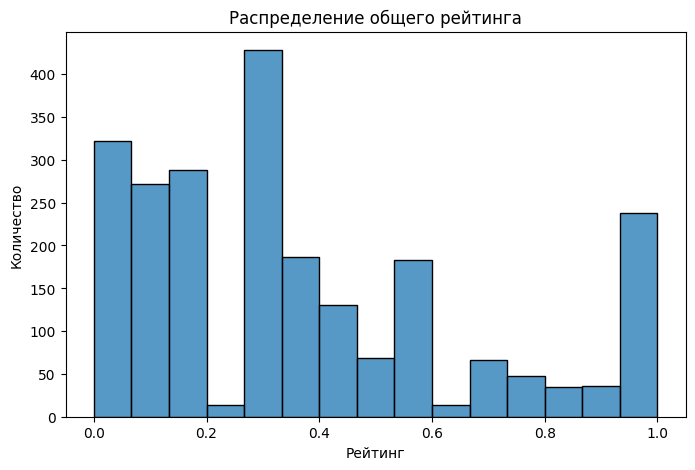

In [13]:
plt.figure(figsize = (8, 5))
sns.histplot(df.total_rating)
plt.title('Распределение общего рейтинга')
plt.xlabel('Рейтинг')
plt.ylabel('Количество')
plt.show()

Распределение стало более равномерным, чем в случае оценок, полученных от экспертов и краудфандинга по отдельности.

In [14]:
combine = df.sample(n = 10)[['image', 'query_text', 'total_rating']].values.tolist()

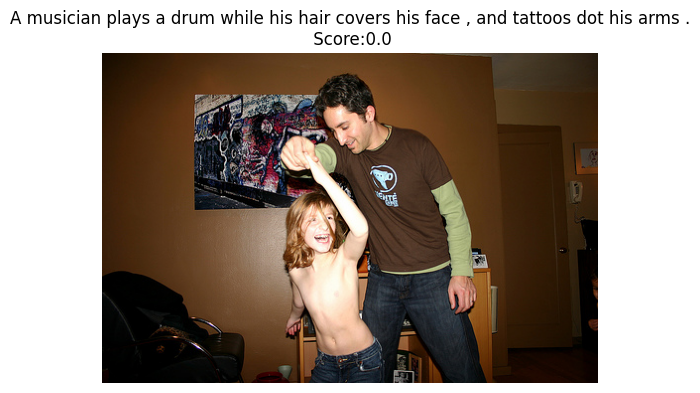

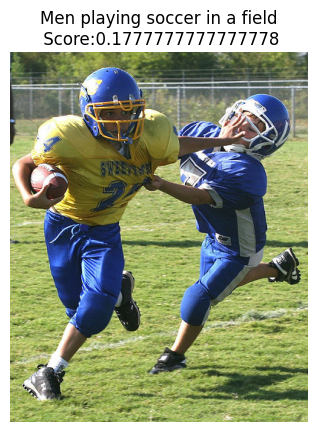

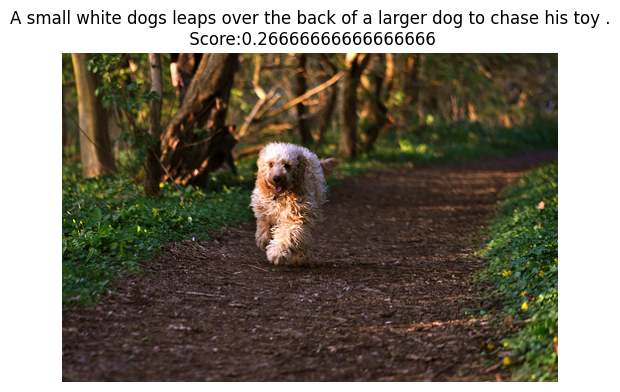

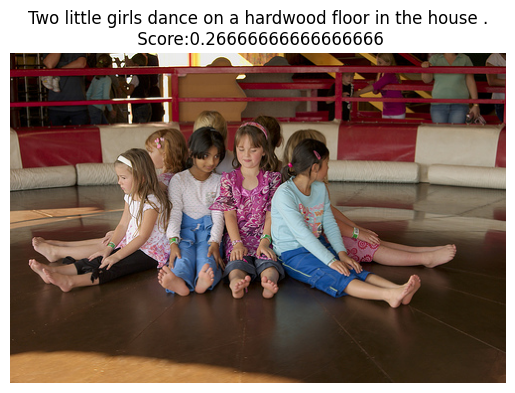

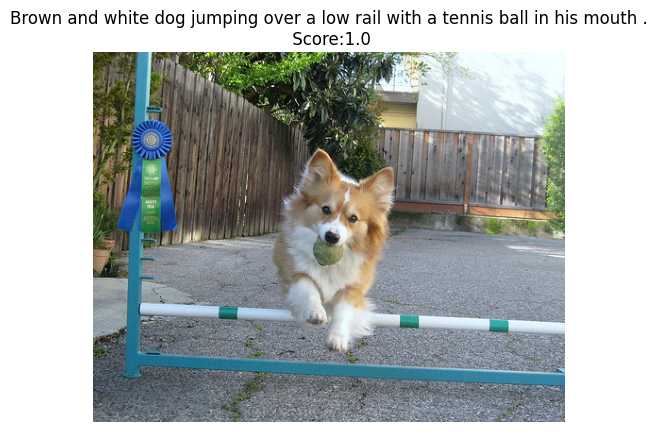

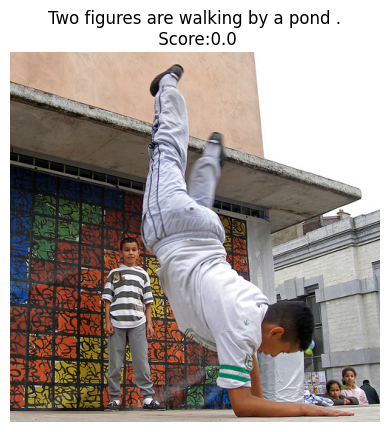

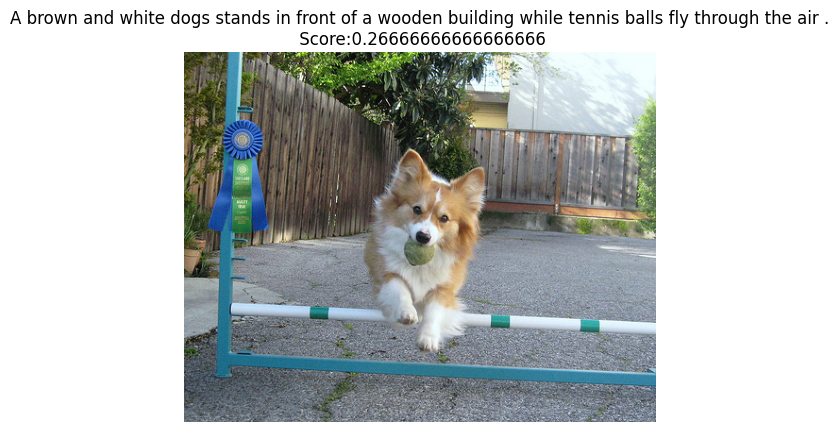

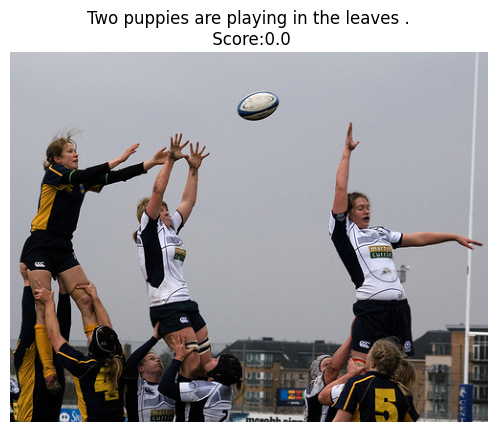

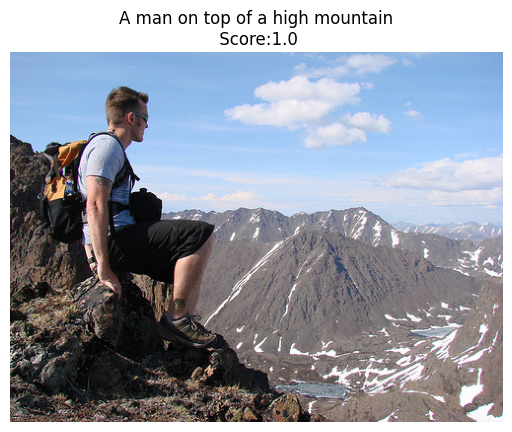

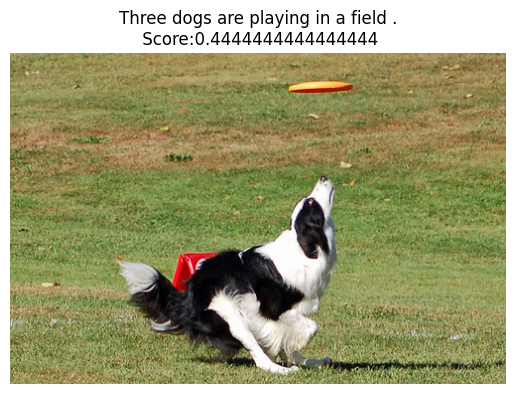

In [15]:
for elem in combine:
    description = elem[1]
    image_path = elem[0]
    score = elem[2]

    image = Image.open(TRAIN_IMG_PATH + '/' + image_path)


    fig, ax = plt.subplots()

    ax.imshow(image)
    ax.axis('off')

    ax.set_title(description + "\n Score:" + str(score), fontsize=12)

    plt.show()

## 2. Проверка данных

В некоторых странах, где работает ваша компания, действуют ограничения по обработке изображений: поисковым сервисам и сервисам, предоставляющим возможность поиска, запрещено без разрешения родителей или законных представителей предоставлять любую информацию, в том числе, но не исключительно тексты, изображения, видео и аудио, содержащие описание, изображение или запись голоса детей. Ребёнком считается любой человек, не достигший 16 лет.

В вашем сервисе строго следуют законам стран, в которых работают. Поэтому при попытке посмотреть изображения, запрещённые законодательством, вместо картинок показывается дисклеймер:

> This image is unavailable in your country in compliance with local laws
>

Однако у вас в PoC нет возможности воспользоваться данным функционалом. Поэтому все изображения, которые нарушают данный закон, нужно удалить из обучающей выборки.

In [16]:
df.head()

,image,query_id,query_text,first,second,third,avg_expert,share_pos,count_pos,count_neg,total_rating
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,1,1,1,0.000000,0.000000,0,3,0.000000
1,1056338697_4f7d7ce270.jpg,434792818_56375e203f.jpg#2,A man and woman look back at the camera while ...,1,1,2,0.111111,0.000000,0,3,0.088889
2,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,A girl wearing a yellow shirt and sunglasses s...,1,1,2,0.111111,0.000000,0,3,0.088889
3,1082379191_ec1e53f996.jpg,1536774449_e16b1b6382.jpg#2,A crowd of people at an outdoor event,1,2,3,0.333333,0.000000,0,3,0.266667
4,1084040636_97d9633581.jpg,256085101_2c2617c5d0.jpg#2,Close-up of dog in profile with mouth open .,2,3,3,0.555556,0.333333,1,2,0.511111


Поскольку наш датасет состоит из различных пар, следует удалить только те фотографии, у которых общий рейтинг превышает 0.6 и содержат слова из массива `BLOCK`. Также стоит удалить фотографии, у которых название картины совпадает с идентификатором описания после удаления последних двух символов, при условии, что в тексте описания по крайней мере один раз встречается слово из списка `BLOCK`.

In [17]:
df = df[~(((df['image'] == df['query_id'].str.slice(0, -2)) |
      (df['total_rating'] <= 0.6)) &
      (df['query_text'].str.contains('|'.join(BLOCK))))]

df = df.reset_index(drop = True)

In [18]:
print(f'df length = {len(df)}')
df.head()

df length = 1842


,image,query_id,query_text,first,second,third,avg_expert,share_pos,count_pos,count_neg,total_rating
0,1056338697_4f7d7ce270.jpg,434792818_56375e203f.jpg#2,A man and woman look back at the camera while ...,1,1,2,0.111111,0.000000,0,3,0.088889
1,1082379191_ec1e53f996.jpg,1536774449_e16b1b6382.jpg#2,A crowd of people at an outdoor event,1,2,3,0.333333,0.000000,0,3,0.266667
2,1084040636_97d9633581.jpg,256085101_2c2617c5d0.jpg#2,Close-up of dog in profile with mouth open .,2,3,3,0.555556,0.333333,1,2,0.511111
3,1084040636_97d9633581.jpg,3396157719_6807d52a81.jpg#2,A dog gets on a trampoline .,1,2,2,0.222222,0.000000,0,3,0.177778
4,1096395242_fc69f0ae5a.jpg,1425069308_488e5fcf9d.jpg#2,A white dog jumps to catch a blue ball in a li...,2,2,2,0.333333,0.000000,0,3,0.266667


## 3. Векторизация изображений

Перейдём к векторизации изображений.

Самый примитивный способ — прочесть изображение и превратить полученную матрицу в вектор. Такой способ нам не подходит: длина векторов может быть сильно разной, так как размеры изображений разные. Поэтому стоит обратиться к свёрточным сетям: они позволяют "выделить" главные компоненты изображений. Как это сделать? Нужно выбрать какую-либо архитектуру, например ResNet-18, посмотреть на слои и исключить полносвязные слои, которые отвечают за конечное предсказание. При этом можно загрузить модель данной архитектуры, предварительно натренированную на датасете ImageNet.

In [19]:
processor = BlipProcessor.from_pretrained("Salesforce/blip-image-captioning-large")
model = BlipForConditionalGeneration.from_pretrained("Salesforce/blip-image-captioning-large").to(DEVICE)

In [20]:
def img_to_text(row, is_train = True):
    if is_train:
        image_path = os.path.join(TRAIN_IMG_PATH, row['image'])
    else:
        image_path = os.path.join(TEST_IMG_PATH, row['image'])

    image = Image.open(image_path)
    image = image.convert('RGB')
    inputs = processor(image, return_tensors="pt").to(DEVICE)

    out = model.generate(**inputs)
    embending = processor.decode(out[0], skip_special_tokens=True)
    return embending

# df['text_from_text'] = df.apply(img_to_text, axis = 1)
# df.drop('img_embend', axis = 1).to_csv('img_to_text_done.csv')

df = pd.read_csv('img_to_text_done.csv').drop('Unnamed: 0', axis = 1)

In [21]:
df.head()

,image,query_id,query_text,first,second,third,avg_expert,share_pos,count_pos,count_neg,total_rating,text_from_text
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,1,1,1,0.000000,0.000000,0,3,0.000000,blond woman in blue dress taking a picture of ...
1,1056338697_4f7d7ce270.jpg,434792818_56375e203f.jpg#2,A man and woman look back at the camera while ...,1,1,2,0.111111,0.000000,0,3,0.088889,blond woman in blue dress taking a picture of ...
2,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,A girl wearing a yellow shirt and sunglasses s...,1,1,2,0.111111,0.000000,0,3,0.088889,blond woman in blue dress taking a picture of ...
3,1082379191_ec1e53f996.jpg,1536774449_e16b1b6382.jpg#2,A crowd of people at an outdoor event,1,2,3,0.333333,0.000000,0,3,0.266667,there are two people sitting on a bench by the...
4,1084040636_97d9633581.jpg,256085101_2c2617c5d0.jpg#2,Close-up of dog in profile with mouth open .,2,3,3,0.555556,0.333333,1,2,0.511111,there is a white dog laying on the floor with ...


Созданы эмбеддинги для всех предоставленных изображений.

## 4. Векторизация текстов

Следующий этап — векторизация текстов. Вы можете поэкспериментировать с несколькими способами векторизации текстов:

- tf-idf
- word2vec
- \*трансформеры (например Bert)

\* — если вы изучали трансформеры в спринте Машинное обучение для текстов.


In [22]:
tokenizer = AutoTokenizer.from_pretrained('BAAI/bge-base-en-v1.5')
bert = AutoModel.from_pretrained('BAAI/bge-base-en-v1.5')
bert.to(DEVICE)
bert.eval()
''

''

In [23]:
def get_text_embedding(text):
    inputs = tokenizer(text, padding=True, truncation=True, return_tensors='pt').to(DEVICE)

    with torch.no_grad():
        model_output = bert(**inputs)
        sentence_embeddings = model_output.last_hidden_state[:, 0]

    sentence_embeddings = torch.nn.functional.normalize(sentence_embeddings, p=2, dim=1)
    sentence_embeddings = sentence_embeddings[0].tolist()
    return sentence_embeddings

df['query_embend'] = df['query_text'].apply(get_text_embedding)
df['text_from_text_embend'] = df['text_from_text'].apply(get_text_embedding)

In [24]:
df.head()

,image,query_id,query_text,first,second,third,avg_expert,share_pos,count_pos,count_neg,total_rating,text_from_text,query_embend,text_from_text_embend
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,1,1,1,0.000000,0.000000,0,3,0.000000,blond woman in blue dress taking a picture of ...,"[0.030293146148324013, 0.01801173947751522, 0....","[-0.020108474418520927, -0.03393710032105446, ..."
1,1056338697_4f7d7ce270.jpg,434792818_56375e203f.jpg#2,A man and woman look back at the camera while ...,1,1,2,0.111111,0.000000,0,3,0.088889,blond woman in blue dress taking a picture of ...,"[0.023669408634305, -0.0044889929704368114, 0....","[-0.020108474418520927, -0.03393710032105446, ..."
2,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,A girl wearing a yellow shirt and sunglasses s...,1,1,2,0.111111,0.000000,0,3,0.088889,blond woman in blue dress taking a picture of ...,"[0.02823301963508129, -0.017888162285089493, 0...","[-0.020108474418520927, -0.03393710032105446, ..."
3,1082379191_ec1e53f996.jpg,1536774449_e16b1b6382.jpg#2,A crowd of people at an outdoor event,1,2,3,0.333333,0.000000,0,3,0.266667,there are two people sitting on a bench by the...,"[-0.004472999833524227, -0.04103744775056839, ...","[0.012266915291547775, -0.03521738201379776, -..."
4,1084040636_97d9633581.jpg,256085101_2c2617c5d0.jpg#2,Close-up of dog in profile with mouth open .,2,3,3,0.555556,0.333333,1,2,0.511111,there is a white dog laying on the floor with ...,"[-0.011200742796063423, 0.007197337690740824, ...","[-0.020250631496310234, 0.017594724893569946, ..."


## 5. Объединение векторов

Подготовьте данные для обучения: объедините векторы изображений и векторы текстов с целевой переменной.

In [25]:
img_embends = df['text_from_text_embend'].apply(pd.Series)
img_embends = img_embends.rename(columns=lambda x: f'text_from_text_embend{x + 1}')
print('img_embends shape', img_embends.shape)
df = pd.concat([img_embends, df.drop('text_from_text_embend', axis=1)], axis=1)

query_embend = df['query_embend'].apply(pd.Series)
query_embend = query_embend.rename(columns=lambda x: f'query_embend{x+ 1}')
print('img_embends shape', len(img_embends))
df = pd.concat([query_embend, df.drop('query_embend', axis=1)], axis=1)
df.head()

img_embends shape (2329, 768)
img_embends shape 2329


,query_embend1,query_embend2,query_embend3,query_embend4,query_embend5,query_embend6,query_embend7,query_embend8,query_embend9,query_embend10,...,query_text,first,second,third,avg_expert,share_pos,count_pos,count_neg,total_rating,text_from_text
0,0.030293,0.018012,0.009060,0.014831,0.089425,-0.009530,-0.056477,0.001096,-0.021990,-0.024295,...,A young child is wearing blue goggles and sitt...,1,1,1,0.000000,0.000000,0,3,0.000000,blond woman in blue dress taking a picture of ...
1,0.023669,-0.004489,0.032505,-0.002304,0.032962,0.008792,0.032597,0.035329,-0.057492,-0.021945,...,A man and woman look back at the camera while ...,1,1,2,0.111111,0.000000,0,3,0.088889,blond woman in blue dress taking a picture of ...
2,0.028233,-0.017888,0.004803,-0.009722,0.043844,0.032746,-0.001344,0.015569,-0.005287,-0.023560,...,A girl wearing a yellow shirt and sunglasses s...,1,1,2,0.111111,0.000000,0,3,0.088889,blond woman in blue dress taking a picture of ...
3,-0.004473,-0.041037,0.034854,-0.053082,0.009530,0.009385,0.020546,0.057723,-0.045771,0.001671,...,A crowd of people at an outdoor event,1,2,3,0.333333,0.000000,0,3,0.266667,there are two people sitting on a bench by the...
4,-0.011201,0.007197,0.008586,-0.000147,0.073982,0.026694,0.053679,0.005860,-0.016751,-0.039386,...,Close-up of dog in profile with mouth open .,2,3,3,0.555556,0.333333,1,2,0.511111,there is a white dog laying on the floor with ...


In [26]:
df = df.drop(['query_id', 'query_text', 'first',
              'second', 'third', 'avg_expert', 'share_pos',
              'count_pos', 'count_neg', 'text_from_text'], axis = 1)

df.head()

,query_embend1,query_embend2,query_embend3,query_embend4,query_embend5,query_embend6,query_embend7,query_embend8,query_embend9,query_embend10,...,text_from_text_embend761,text_from_text_embend762,text_from_text_embend763,text_from_text_embend764,text_from_text_embend765,text_from_text_embend766,text_from_text_embend767,text_from_text_embend768,image,total_rating
0,0.030293,0.018012,0.009060,0.014831,0.089425,-0.009530,-0.056477,0.001096,-0.021990,-0.024295,...,-0.031709,-0.030597,-0.014250,0.033419,0.017884,-0.032308,0.029309,0.029407,1056338697_4f7d7ce270.jpg,0.000000
1,0.023669,-0.004489,0.032505,-0.002304,0.032962,0.008792,0.032597,0.035329,-0.057492,-0.021945,...,-0.031709,-0.030597,-0.014250,0.033419,0.017884,-0.032308,0.029309,0.029407,1056338697_4f7d7ce270.jpg,0.088889
2,0.028233,-0.017888,0.004803,-0.009722,0.043844,0.032746,-0.001344,0.015569,-0.005287,-0.023560,...,-0.031709,-0.030597,-0.014250,0.033419,0.017884,-0.032308,0.029309,0.029407,1056338697_4f7d7ce270.jpg,0.088889
3,-0.004473,-0.041037,0.034854,-0.053082,0.009530,0.009385,0.020546,0.057723,-0.045771,0.001671,...,-0.047586,0.026688,0.004201,-0.022034,0.004818,0.024807,0.021457,-0.038226,1082379191_ec1e53f996.jpg,0.266667
4,-0.011201,0.007197,0.008586,-0.000147,0.073982,0.026694,0.053679,0.005860,-0.016751,-0.039386,...,0.025207,-0.010659,0.052181,0.024888,0.017072,0.028777,-0.037947,0.035443,1084040636_97d9633581.jpg,0.511111


## 6. Обучение модели предсказания соответствия

Для обучения разделите датасет на тренировочную и тестовую выборки. Простое случайное разбиение не подходит: нужно исключить попадание изображения и в обучающую, и в тестовую выборки.
Для того чтобы учесть изображения при разбиении, можно воспользоваться классом [GroupShuffleSplit](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GroupShuffleSplit.html) из библиотеки sklearn.model_selection.

Код ниже разбивает датасет на тренировочную и тестовую выборки в пропорции 7:3 так, что строки с одинаковым значением 'group_column' будут содержаться либо в тестовом, либо в тренировочном датасете.

```
from sklearn.model_selection import GroupShuffleSplit
gss = GroupShuffleSplit(n_splits=1, train_size=.7, random_state=42)
train_indices, test_indices = next(gss.split(X=df.drop(columns=['target']), y=df['target'], groups=df['group_column']))
train_df, test_df = df.loc[train_indices], df.loc[test_indices]

```

Какую модель использовать — выберите самостоятельно. Также вам предстоит выбрать метрику качества либо реализовать свою.

In [27]:
gss_valid = GroupShuffleSplit(n_splits=1, train_size=0.80, random_state=1234)

train_indices, valid_indices = next(gss_valid.split(X=df.drop(columns=['total_rating']), y=df['total_rating'], groups=df['image']))
train_df, valid_df = df.loc[train_indices].reset_index(drop = True), df.loc[valid_indices].reset_index(drop = True)

print('Length of train_df:', len(train_df))
print('Length of valid_df:', len(valid_df))

Length of train_df: 1871
Length of valid_df: 458


In [28]:
[i for i in train_df.image.unique() if i in valid_df.image.unique()]

[]

Повторов image не наблюдается.

In [29]:
valid_df = valid_df.drop(columns=['image'])
train_df = train_df.drop(columns=['image'])

train_features = train_df.drop(columns=['total_rating'])
train_target = train_df['total_rating']

valid_features = valid_df.drop(columns=['total_rating'])
valid_target = valid_df['total_rating']

In [30]:
train_tensor = torch.tensor(train_features.values, dtype=torch.float32).to(DEVICE)
valid_tensor = torch.tensor(valid_features.values, dtype=torch.float32).to(DEVICE)

train_target_tensor = torch.tensor(train_target.values, dtype=torch.float32).to(DEVICE)
valid_target_tensor = torch.tensor(valid_target.values, dtype=torch.float32).to(DEVICE)

In [31]:
class MyDataset(Dataset):
    def __init__(self, embends, targets):
        self.embends = embends
        self.targets = targets

    def __len__(self):
        return len(self.embends)

    def __getitem__(self, idx):
        return self.embends[idx], self.targets[idx]

batch_size = 8
train_dataset = MyDataset(train_tensor, train_target_tensor)
train_dataloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

valid_dataset = MyDataset(valid_tensor, valid_target_tensor)
valid_dataloader = DataLoader(valid_dataset, batch_size=batch_size, shuffle=False)

In [32]:
class NeuralNetwork(nn.Module):
    def __init__(self, input_size):
        super(NeuralNetwork, self).__init__()
        hidden_size = 16
        self.fc1 = nn.Linear(input_size, hidden_size)
        self.bn1 = nn.BatchNorm1d(hidden_size)
        self.fc2 = nn.Linear(hidden_size, 1)
        self.relu = nn.ReLU()
        self.dropout = nn.Dropout(0.5)

    def forward(self, x):
        x = self.fc1(x)
        x = self.bn1(x)
        x = self.relu(x)
        x = self.fc2(x)
        x = self.relu(x)
        x = self.dropout(x)
        return x

In [33]:
net = NeuralNetwork(train_tensor.shape[1]).to(DEVICE)

optimizer = optim.Adam(net.parameters(), lr=1e-6, weight_decay=1e-3)

criterion = nn.MSELoss()
l1_lambda = 1e-3
num_epochs = 100
for epoch in range(num_epochs):
    net.train()
    total_loss = 0.0

    for i, (emb, target) in enumerate(train_dataloader):
        optimizer.zero_grad()

        output = net(emb)
        loss = criterion(output, target)

        l1_reg = torch.tensor(0.0, requires_grad=True).to(DEVICE)
        for param in net.parameters():
            l1_reg += torch.abs(param).sum()
        loss = loss + l1_lambda * l1_reg

        loss.backward()
        optimizer.step()

        total_loss += loss.item()

    print(f'Epoch [{epoch + 1}/{num_epochs}], Loss: {total_loss / (i + 1):.4f}')

    net.eval()
    total_mae = 0.0

    with torch.no_grad():
        for i, (emb, target) in enumerate(valid_dataloader):
            output = net(emb)
            mae = torch.abs(output - target).mean().item()
            total_mae += mae

    average_mae = total_mae / (i + 1)
    print(f'Validation MAE: {average_mae:.4f}')

/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([8])) that is different to the input size (torch.Size([8, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([7])) that is different to the input size (torch.Size([7, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/100], Loss: 0.6847
Validation MAE: 0.3381
Epoch [2/100], Loss: 0.6804
Validation MAE: 0.3335
Epoch [3/100], Loss: 0.6645
Validation MAE: 0.3349
Epoch [4/100], Loss: 0.6862
Validation MAE: 0.3328
Epoch [5/100], Loss: 0.6682
Validation MAE: 0.3272
Epoch [6/100], Loss: 0.6648
Validation MAE: 0.3344
Epoch [7/100], Loss: 0.6677
Validation MAE: 0.3298
Epoch [8/100], Loss: 0.6476
Validation MAE: 0.3333
Epoch [9/100], Loss: 0.6489
Validation MAE: 0.3240
Epoch [10/100], Loss: 0.6541
Validation MAE: 0.3220
Epoch [11/100], Loss: 0.6380
Validation MAE: 0.3241
Epoch [12/100], Loss: 0.6355
Validation MAE: 0.3204
Epoch [13/100], Loss: 0.6299
Validation MAE: 0.3235
Epoch [14/100], Loss: 0.6256
Validation MAE: 0.3179
Epoch [15/100], Loss: 0.6254
Validation MAE: 0.3224
Epoch [16/100], Loss: 0.6170
Validation MAE: 0.3134
Epoch [17/100], Loss: 0.6203
Validation MAE: 0.3112
Epoch [18/100], Loss: 0.6179
Validation MAE: 0.3148
Epoch [19/100], Loss: 0.6062
Validation MAE: 0.3147
Epoch [20/100], Loss:

Качество модели не внушает доверия, и возможно, она могла переобучиться, так как у нее малое количество данных. Поэтому целесообразно рассмотреть предсказания, основанные на расстоянии между двумя эмбеддингами.

## 7. Тестирование модели

Настало время протестировать модель. Для этого получите эмбеддинги для всех тестовых изображений из папки `test_images`, выберите случайные 10 запросов из файла `test_queries.csv` и для каждого запроса выведите наиболее релевантное изображение. Сравните визуально качество поиска.

In [34]:
df_queries = df_queries.sample(n=10, random_state = 1234).reset_index(drop = True)

df_queries['query_embend'] = df_queries['query_text'].apply(get_text_embedding)

query_embend = df_queries['query_embend'].apply(pd.Series)
query_embend = query_embend.rename(columns=lambda x: f'query_embend{x+ 1}')
df_queries = pd.concat([query_embend, df_queries.drop('query_embend', axis=1)], axis=1)

df_queries

,query_embend1,query_embend2,query_embend3,query_embend4,query_embend5,query_embend6,query_embend7,query_embend8,query_embend9,query_embend10,...,query_embend762,query_embend763,query_embend764,query_embend765,query_embend766,query_embend767,query_embend768,query_id,query_text,image
0,-0.028946,-0.019533,0.028854,-0.030572,-0.011692,-0.012403,-0.032207,0.018889,-0.008988,-0.023785,...,-0.024059,-0.012883,-0.007578,0.016843,0.027455,0.010359,-0.016486,2121140070_a09644550b.jpg#2,A group of people in a large yard toss a disc .,2121140070_a09644550b.jpg
1,-0.058959,-0.021581,0.014346,0.041035,0.008632,-0.000598,0.003305,0.028577,-0.031073,-0.042178,...,-0.047949,0.032786,-0.004309,0.022359,-0.021893,0.038454,0.012188,3722572342_6904d11d52.jpg#1,A red high speed racing boat skips across the ...,3722572342_6904d11d52.jpg
2,0.013045,-0.060527,-0.009285,-0.014279,0.068301,-0.010834,-0.002844,0.033282,-0.027217,-0.058919,...,-0.018695,-0.026268,0.073406,0.035044,0.047291,0.004823,-0.018169,3459871361_92d1ecda36.jpg#0,A bicyclist is jumping on ramp covered with gr...,3459871361_92d1ecda36.jpg
3,-0.068182,-0.046281,0.022255,0.031036,0.010378,-0.007169,0.049489,-0.004512,-0.036874,0.001267,...,-0.011736,0.005066,0.031925,-0.012341,0.003874,-0.011192,0.016995,3466891862_9afde75568.jpg#3,The small dog returns with his stick proudly .,3466891862_9afde75568.jpg
4,-0.024384,-0.081972,-0.062554,-0.012907,0.041870,0.019666,0.089347,-0.044569,-0.027163,-0.051377,...,0.028260,-0.027911,0.039948,-0.007728,0.038325,-0.004509,-0.033278,2448210587_9fe7ea5f42.jpg#2,A white bulldog sitting on a tree stump gives ...,2448210587_9fe7ea5f42.jpg
5,0.004532,-0.066246,0.015990,-0.018294,0.069694,-0.013600,0.003855,-0.023022,-0.016228,-0.044105,...,0.019583,-0.018292,0.035653,-0.060088,-0.004439,0.018483,-0.023760,3421547427_53411b6278.jpg#4,The tennis player in the blue shirt is holding...,3421547427_53411b6278.jpg
6,-0.010223,0.009810,-0.026848,-0.026191,0.076823,0.037502,0.027442,0.032085,-0.077721,-0.022550,...,-0.042946,-0.032592,-0.002008,0.022451,-0.010356,0.031907,0.021013,3351418768_596ef7fd6f.jpg#4,A woman in purple with two children in the mou...,3351418768_596ef7fd6f.jpg
7,0.005478,0.002820,0.063574,-0.036657,0.064836,0.027806,0.007547,0.038946,-0.031002,-0.048973,...,0.000082,0.000210,-0.032625,-0.024670,-0.004909,0.002994,-0.001668,2107838729_a527e434bd.jpg#4,Little boy standing on the bank of a river .,2107838729_a527e434bd.jpg
8,0.011184,-0.036713,-0.018114,-0.030897,0.026088,0.021994,-0.008910,-0.022194,-0.059473,-0.004861,...,0.012990,0.021552,-0.052086,-0.032774,-0.016241,-0.001947,0.003292,1468389504_c724bdcad0.jpg#2,Two little girls in pink outfits play on a yel...,1468389504_c724bdcad0.jpg
9,0.014680,-0.017654,-0.007640,0.002767,0.033418,0.042842,0.014135,-0.024931,-0.006168,-0.025907,...,0.050324,0.033587,-0.008683,0.009091,-0.021922,0.012893,0.024912,3488087117_2719647989.jpg#3,Little brown and white dog running on the side...,3488087117_2719647989.jpg


In [35]:
df_images['img_text'] = df_images.apply(lambda row: img_to_text(row, False), axis=1)
df_images['img_embend'] = df_images['img_text'].apply(get_text_embedding)

img_embends = df_images['img_embend'].apply(pd.Series)
img_embends = img_embends.rename(columns=lambda x: f'img_embend{x + 1}')
df_images = pd.concat([img_embends, df_images.drop(['img_embend', 'img_text'], axis=1)], axis=1)

df_images.head()

/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1260: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


,img_embend1,img_embend2,img_embend3,img_embend4,img_embend5,img_embend6,img_embend7,img_embend8,img_embend9,img_embend10,...,img_embend760,img_embend761,img_embend762,img_embend763,img_embend764,img_embend765,img_embend766,img_embend767,img_embend768,image
0,-0.025527,-0.017201,0.032959,0.003890,0.028549,-0.018540,0.031315,0.051799,-0.059824,-0.037656,...,0.010994,0.021067,-0.023281,-0.042327,0.058850,-0.017133,-0.029596,0.060243,-0.056135,3356748019_2251399314.jpg
1,0.023195,-0.091636,-0.021510,-0.038634,0.002435,0.119314,0.018422,0.034184,-0.018817,-0.024042,...,0.032102,-0.032119,-0.022846,0.015066,-0.030111,0.010983,-0.006116,-0.008213,0.013443,2887171449_f54a2b9f39.jpg
2,-0.026400,-0.004029,0.051747,-0.067016,-0.000532,-0.050055,0.028269,0.100707,-0.018916,-0.039149,...,-0.048994,0.042559,-0.052616,-0.046299,0.000060,-0.004543,0.034628,0.012369,0.028816,3089107423_81a24eaf18.jpg
3,-0.000696,-0.004234,-0.030994,0.025363,0.008278,-0.041251,0.097010,-0.007161,0.014752,-0.045679,...,-0.036393,-0.014085,-0.019154,-0.000439,0.027951,0.004251,-0.030774,0.009208,-0.048899,1429546659_44cb09cbe2.jpg
4,0.005629,-0.037115,0.053212,-0.019170,0.012918,0.017052,0.040370,-0.010695,-0.011599,-0.033516,...,-0.042645,-0.058413,-0.044463,0.000277,0.001827,0.031936,-0.039388,-0.020183,0.022999,1177994172_10d143cb8d.jpg


In [36]:
net.eval()
best_combine = []
for index_query, query in df_queries.iterrows():
    best_score = -1
    best_combine_temp = []

    query_temp = query.drop(['query_id', 'query_text', 'image'])

    for index_image, image in df_images.iterrows():
        image_temp = image.drop('image')
        df_temp = pd.concat([image_temp, query_temp], axis = 0)
        df_temp = torch.tensor([df_temp], dtype=torch.float32).to(DEVICE)

        similarity_score = net(df_temp)

        if similarity_score > best_score:
            best_score = similarity_score
            best_combine_temp = [query['query_text'], image['image']]

    best_combine.append(best_combine_temp)
    print(best_score)

print(best_combine)

tensor([[0.9177]], device='cuda:0', grad_fn=<ReluBackward0>)
tensor([[0.5415]], device='cuda:0', grad_fn=<ReluBackward0>)
tensor([[0.5910]], device='cuda:0', grad_fn=<ReluBackward0>)
tensor([[0.3798]], device='cuda:0', grad_fn=<ReluBackward0>)
tensor([[0.6666]], device='cuda:0', grad_fn=<ReluBackward0>)
tensor([[0.4708]], device='cuda:0', grad_fn=<ReluBackward0>)
tensor([[0.4374]], device='cuda:0', grad_fn=<ReluBackward0>)
tensor([[0.4809]], device='cuda:0', grad_fn=<ReluBackward0>)
tensor([[0.4666]], device='cuda:0', grad_fn=<ReluBackward0>)
tensor([[0.7223]], device='cuda:0', grad_fn=<ReluBackward0>)
[['A group of people in a large yard toss a disc .', '2709359730_13bca100af.jpg'], ['A red high speed racing boat skips across the water .', '269650644_059a84ece5.jpg'], ['A bicyclist is jumping on ramp covered with graffiti .', '2709359730_13bca100af.jpg'], ['The small dog returns with his stick proudly .', '2505465055_f1e6cf9b76.jpg'], ['A white bulldog sitting on a tree stump gives pa

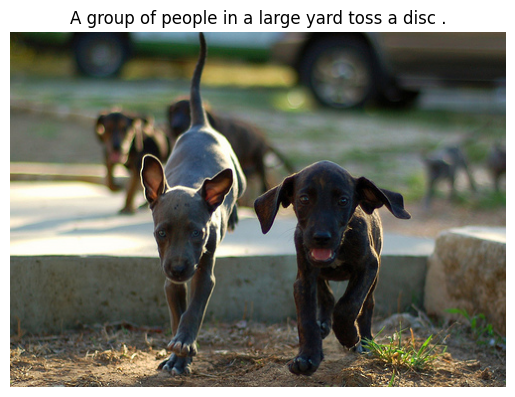

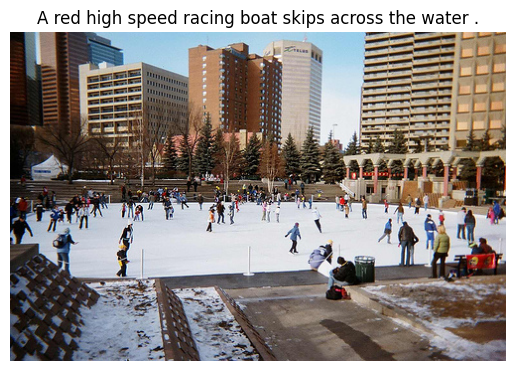

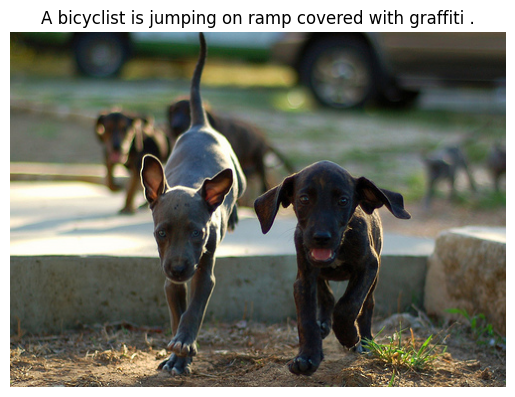

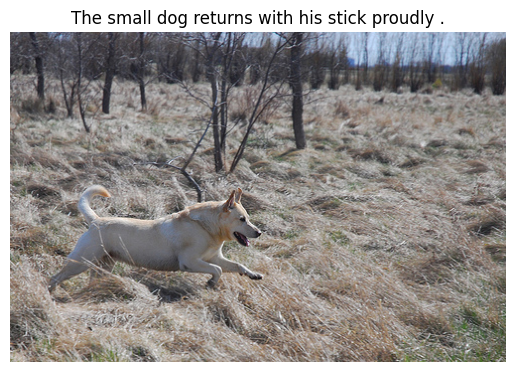

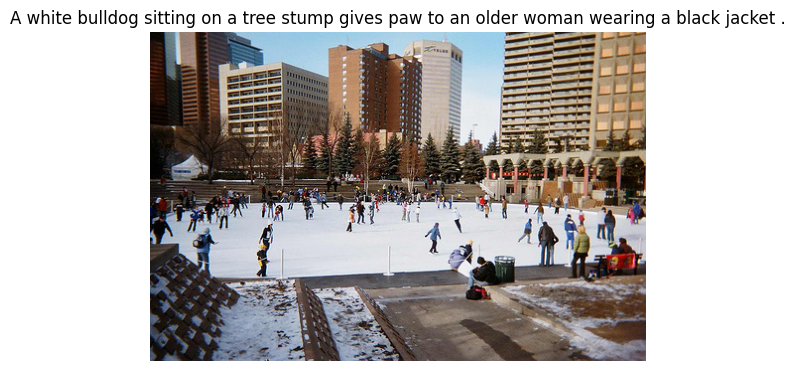

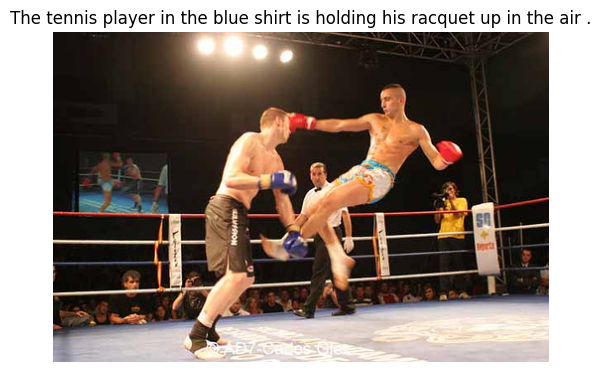

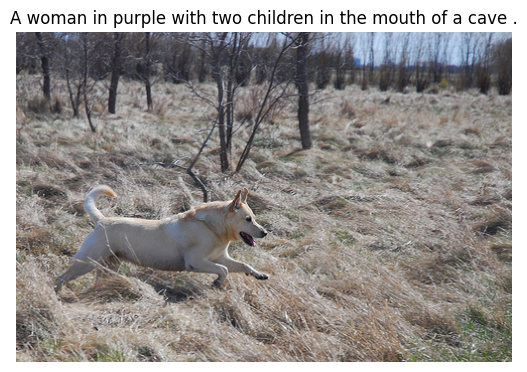

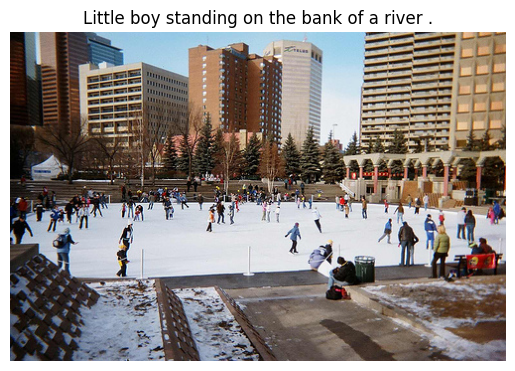

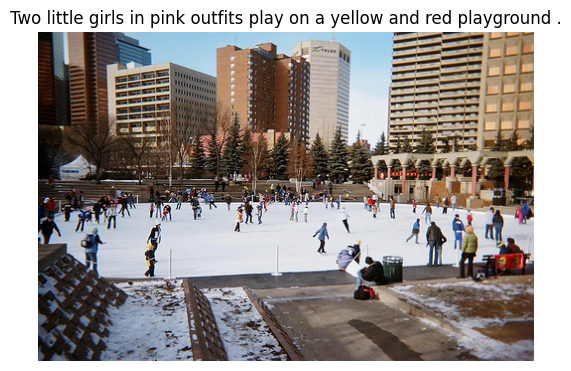

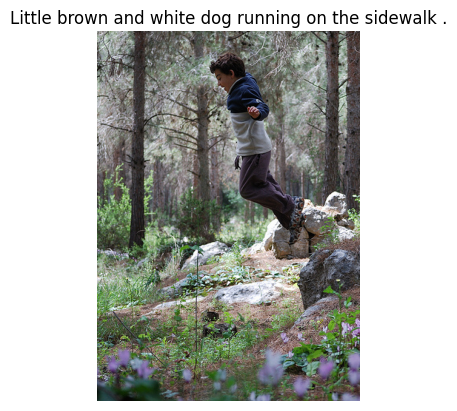

In [37]:
for combine in best_combine:
    description = combine[0]
    image_path = combine[1]

    image = Image.open(TEST_IMG_PATH + '/' + image_path)
    fig, ax = plt.subplots()

    ax.imshow(image)
    ax.axis('off')

    ax.set_title(description, fontsize=12)

    plt.show()

Как ожидалось, модель переобучена.

In [38]:
from sklearn.metrics.pairwise import cosine_similarity

best_combine = []
for index_query, query in df_queries.iterrows():
    best_similarity = 0
    best_combine_temp = []

    query_vector = query.drop(['query_id', 'query_text', 'image']).values.reshape(1, -1)

    for index_image, image in df_images.iterrows():
        image_vector = image.drop('image').values.reshape(1, -1)
        cosine_sim = cosine_similarity(query_vector, image_vector)[0][0]

        if cosine_sim > best_similarity:
            best_similarity = cosine_sim
            best_combine_temp = [query['query_text'], image['image']]

    best_combine.append(best_combine_temp)
    print(best_similarity)

print(best_combine)

0.6985801469265588
0.756826424224799
0.6369497100026789
0.7705319853148748
0.7223611902837739
0.7696064297184299
0.5598494426746297
0.6399392697233435
0.6724297260705796
0.726498636750451
[['A group of people in a large yard toss a disc .', '2121140070_a09644550b.jpg'], ['A red high speed racing boat skips across the water .', '3722572342_6904d11d52.jpg'], ['A bicyclist is jumping on ramp covered with graffiti .', '2885891981_6b02620ae9.jpg'], ['The small dog returns with his stick proudly .', '3466891862_9afde75568.jpg'], ['A white bulldog sitting on a tree stump gives paw to an older woman wearing a black jacket .', '2448210587_9fe7ea5f42.jpg'], ['The tennis player in the blue shirt is holding his racquet up in the air .', '3421547427_53411b6278.jpg'], ['A woman in purple with two children in the mouth of a cave .', '3351418768_596ef7fd6f.jpg'], ['Little boy standing on the bank of a river .', '1580671272_3e99d94305.jpg'], ['Two little girls in pink outfits play on a yellow and red p

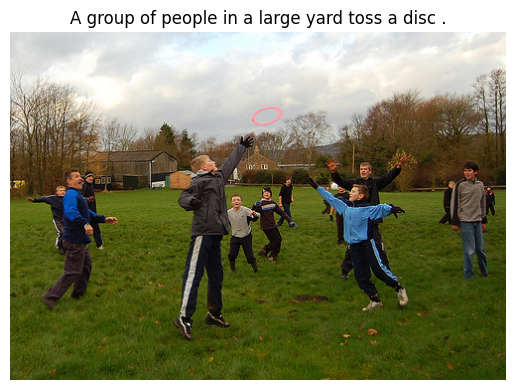

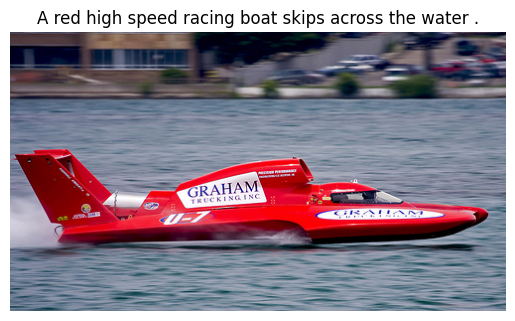

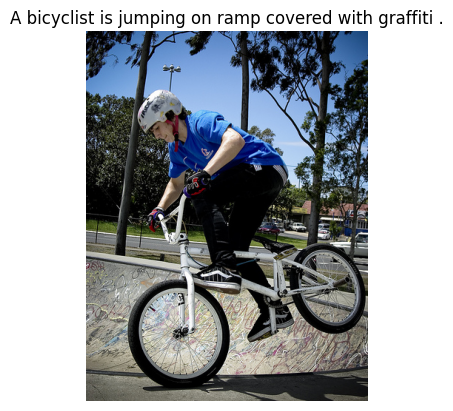

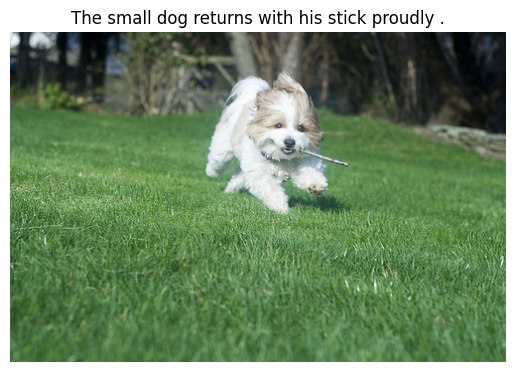

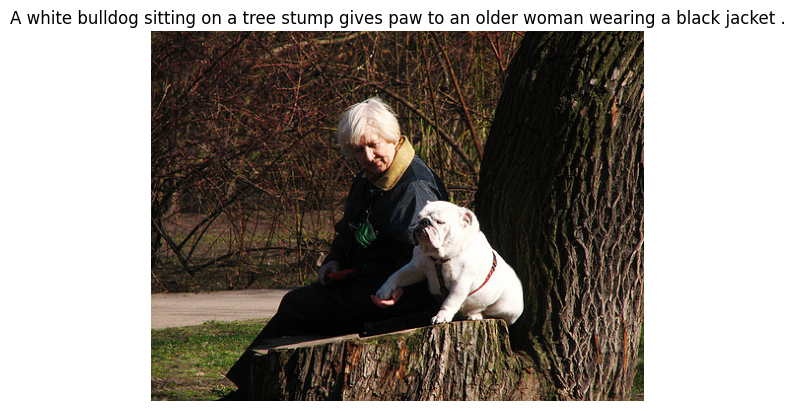

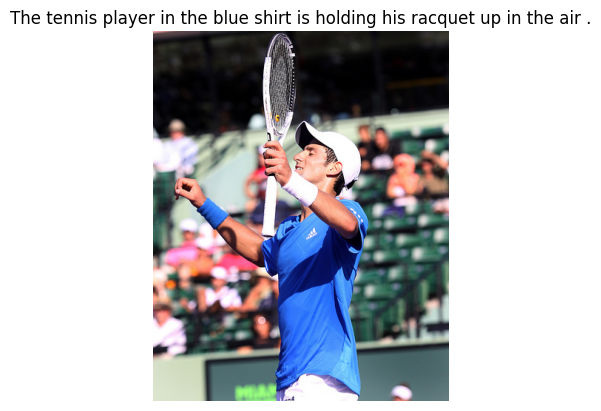

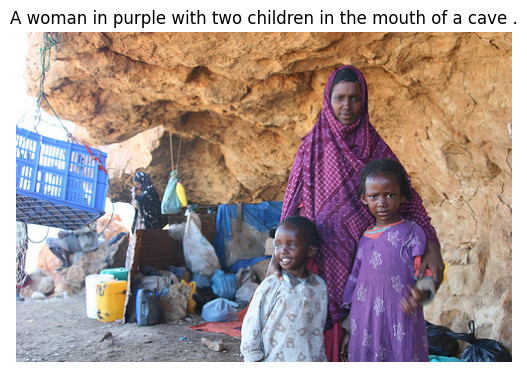

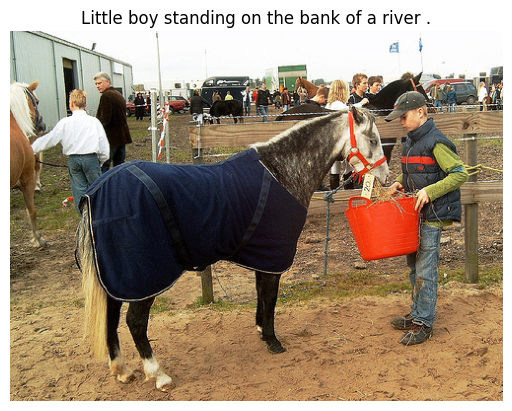

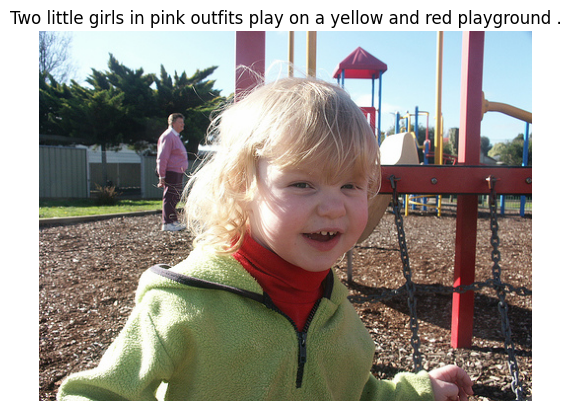

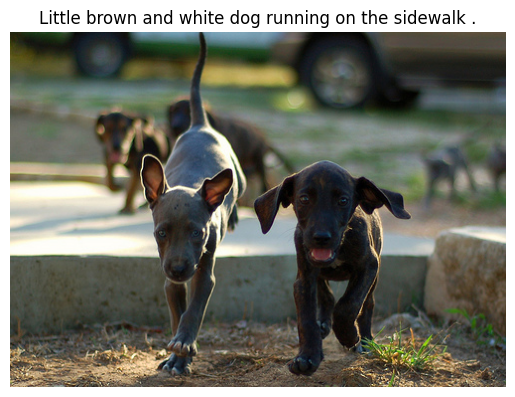

In [39]:
for combine in best_combine:
    description = combine[0]
    image_path = combine[1]

    image = Image.open(TEST_IMG_PATH + '/' + image_path)
    fig, ax = plt.subplots()

    ax.imshow(image)
    ax.axis('off')

    ax.set_title(description, fontsize=12)

    plt.show()

Как видно, только к одному описанию не удалось найти подходящее изображение. Проблемы с распознаванием цвета возникли в двух фотографиях. Кроме того, не исключена ситуация, когда совсем не удается найти изображение, полностью соответствующее описанию.

## 8. Выводы

- Jupyter Notebook открыт
- Весь код выполняется без ошибок
- Ячейки с кодом расположены в порядке исполнения
- Исследовательский анализ данных выполнен
- Проверены экспертные оценки и краудсорсинговые оценки
- Из датасета исключены те объекты, которые выходят за рамки юридических ограничений
- Изображения векторизованы
- Текстовые запросы векторизованы
- Данные корректно разбиты на тренировочную и тестовую выборки
- Предложена метрика качества работы модели
- Предложена модель схожести изображений и текстового запроса
- Модель обучена
- По итогам обучения модели сделаны выводы
- Проведено тестирование работы модели
- По итогам тестирования визуально сравнили качество поиска